In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from scipy.stats import ttest_ind

pd.set_option('display.max_rows', 50)  # показывать больше строк
pd.set_option('display.max_columns', 50)  # показывать больше колонок

In [2]:
school = pd.read_csv('stud_math.csv')

In [3]:
display(school.head(10))

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,"studytime, granular",higher,internet,romantic,famrel,freetime,goout,health,absences,score
0,GP,F,18,U,NaN,A,4.0,4.0,at_home,teacher,course,mother,2.0,2.0,0.0,yes,no,no,no,yes,-6.0,yes,NaN,no,4.0,3.0,4.0,3.0,6.0,30.0
1,GP,F,17,U,GT3,NaN,1.0,1.0,at_home,other,course,father,1.0,2.0,0.0,no,yes,no,no,no,-6.0,yes,yes,no,5.0,3.0,3.0,3.0,4.0,30.0
2,GP,F,15,U,LE3,T,1.0,1.0,at_home,other,other,mother,1.0,2.0,3.0,yes,no,NaN,no,yes,-6.0,yes,yes,NaN,4.0,3.0,2.0,3.0,10.0,50.0
3,GP,F,15,U,GT3,T,4.0,2.0,health,NaN,home,mother,1.0,3.0,0.0,no,yes,yes,yes,yes,-9.0,yes,yes,yes,3.0,2.0,2.0,5.0,2.0,75.0
4,GP,F,16,U,GT3,T,3.0,3.0,other,other,home,father,1.0,2.0,0.0,no,yes,yes,no,yes,-6.0,yes,no,no,4.0,3.0,2.0,5.0,4.0,50.0
5,GP,M,16,U,LE3,T,4.0,3.0,services,other,reputation,mother,1.0,2.0,0.0,no,yes,yes,yes,yes,-6.0,yes,yes,no,5.0,4.0,2.0,5.0,10.0,75.0
6,GP,M,16,NaN,LE3,T,2.0,2.0,other,other,home,mother,1.0,2.0,0.0,no,no,no,no,yes,-6.0,yes,yes,no,4.0,4.0,4.0,3.0,0.0,55.0
7,GP,F,17,U,GT3,A,4.0,4.0,other,teacher,home,mother,2.0,2.0,0.0,yes,yes,no,no,yes,-6.0,yes,no,no,4.0,1.0,4.0,1.0,6.0,30.0
8,GP,M,15,U,LE3,A,3.0,2.0,services,other,home,mother,1.0,2.0,0.0,no,yes,yes,no,yes,-6.0,yes,yes,no,NaN,2.0,2.0,1.0,0.0,95.0
9,GP,M,15,U,NaN,NaN,3.0,4.0,other,other,home,mother,1.0,2.0,0.0,no,yes,yes,yes,yes,-6.0,yes,yes,no,5.0,5.0,1.0,5.0,0.0,75.0


In [4]:
school = school.rename(columns={'studytime, granular': 'st_g'})

In [5]:
school.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 30 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   school      395 non-null    object 
 1   sex         395 non-null    object 
 2   age         395 non-null    int64  
 3   address     378 non-null    object 
 4   famsize     368 non-null    object 
 5   Pstatus     350 non-null    object 
 6   Medu        392 non-null    float64
 7   Fedu        371 non-null    float64
 8   Mjob        376 non-null    object 
 9   Fjob        359 non-null    object 
 10  reason      378 non-null    object 
 11  guardian    364 non-null    object 
 12  traveltime  367 non-null    float64
 13  studytime   388 non-null    float64
 14  failures    373 non-null    float64
 15  schoolsup   386 non-null    object 
 16  famsup      356 non-null    object 
 17  paid        355 non-null    object 
 18  activities  381 non-null    object 
 19  nursery     379 non-null    o

In [6]:
school.Medu.dtype

dtype('float64')

In [7]:
print(school.address.value_counts())

U    295
R     83
Name: address, dtype: int64


In [8]:
school.address.head(30)

0       U
1       U
2       U
3       U
4       U
5       U
6     NaN
7       U
8       U
9       U
10      U
11      U
12      U
13      U
14      U
15      U
16      U
17      U
18      U
19      U
20      U
21      U
22      U
23      U
24      R
25      U
26      U
27      U
28      U
29      U
Name: address, dtype: object

In [9]:
"""С помощью цикла меняем все пропуски для численных переменных на медианное значение,
а для номинативных - на моду"""
for column in school.columns:
    if school[column].dtype == 'object':
        mod = school[column].mode()[0]
        school[column].fillna(value=mod, inplace=True, axis=0)
    else:
        med = school[column].median()
        school[column].fillna(value=med, inplace=True, axis=0)
school.head(30)

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,st_g,higher,internet,romantic,famrel,freetime,goout,health,absences,score
0,GP,F,18,U,GT3,A,4.0,4.0,at_home,teacher,course,mother,2.0,2.0,0.0,yes,no,no,no,yes,-6.0,yes,yes,no,4.0,3.0,4.0,3.0,6.0,30.0
1,GP,F,17,U,GT3,T,1.0,1.0,at_home,other,course,father,1.0,2.0,0.0,no,yes,no,no,no,-6.0,yes,yes,no,5.0,3.0,3.0,3.0,4.0,30.0
2,GP,F,15,U,LE3,T,1.0,1.0,at_home,other,other,mother,1.0,2.0,3.0,yes,no,no,no,yes,-6.0,yes,yes,no,4.0,3.0,2.0,3.0,10.0,50.0
3,GP,F,15,U,GT3,T,4.0,2.0,health,other,home,mother,1.0,3.0,0.0,no,yes,yes,yes,yes,-9.0,yes,yes,yes,3.0,2.0,2.0,5.0,2.0,75.0
4,GP,F,16,U,GT3,T,3.0,3.0,other,other,home,father,1.0,2.0,0.0,no,yes,yes,no,yes,-6.0,yes,no,no,4.0,3.0,2.0,5.0,4.0,50.0
5,GP,M,16,U,LE3,T,4.0,3.0,services,other,reputation,mother,1.0,2.0,0.0,no,yes,yes,yes,yes,-6.0,yes,yes,no,5.0,4.0,2.0,5.0,10.0,75.0
6,GP,M,16,U,LE3,T,2.0,2.0,other,other,home,mother,1.0,2.0,0.0,no,no,no,no,yes,-6.0,yes,yes,no,4.0,4.0,4.0,3.0,0.0,55.0
7,GP,F,17,U,GT3,A,4.0,4.0,other,teacher,home,mother,2.0,2.0,0.0,yes,yes,no,no,yes,-6.0,yes,no,no,4.0,1.0,4.0,1.0,6.0,30.0
8,GP,M,15,U,LE3,A,3.0,2.0,services,other,home,mother,1.0,2.0,0.0,no,yes,yes,no,yes,-6.0,yes,yes,no,4.0,2.0,2.0,1.0,0.0,95.0
9,GP,M,15,U,GT3,T,3.0,4.0,other,other,home,mother,1.0,2.0,0.0,no,yes,yes,yes,yes,-6.0,yes,yes,no,5.0,5.0,1.0,5.0,0.0,75.0


In [10]:
"""Замена выполнена успешно, пропусков больше нет"""
school.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 30 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   school      395 non-null    object 
 1   sex         395 non-null    object 
 2   age         395 non-null    int64  
 3   address     395 non-null    object 
 4   famsize     395 non-null    object 
 5   Pstatus     395 non-null    object 
 6   Medu        395 non-null    float64
 7   Fedu        395 non-null    float64
 8   Mjob        395 non-null    object 
 9   Fjob        395 non-null    object 
 10  reason      395 non-null    object 
 11  guardian    395 non-null    object 
 12  traveltime  395 non-null    float64
 13  studytime   395 non-null    float64
 14  failures    395 non-null    float64
 15  schoolsup   395 non-null    object 
 16  famsup      395 non-null    object 
 17  paid        395 non-null    object 
 18  activities  395 non-null    object 
 19  nursery     395 non-null    o

In [11]:
"""Подсчет уникальных значений в нашем датасете показывает, что вариаций в колонках не сильно много"""
school.nunique()

school         2
sex            2
age            8
address        2
famsize        2
Pstatus        2
Medu           5
Fedu           6
Mjob           5
Fjob           5
reason         4
guardian       3
traveltime     4
studytime      4
failures       4
schoolsup      2
famsup         2
paid           2
activities     2
nursery        2
st_g           4
higher         2
internet       2
romantic       2
famrel         6
freetime       5
goout          5
health         5
absences      36
score         18
dtype: int64

In [12]:
"""Посмотрим на колонку 'age', похоже имеются выбросы"""
school.age.value_counts()

16    104
17     98
15     82
18     82
19     24
20      3
21      1
22      1
Name: age, dtype: int64

count    395.000000
mean      16.696203
std        1.276043
min       15.000000
25%       16.000000
50%       17.000000
75%       18.000000
max       22.000000
Name: age, dtype: float64

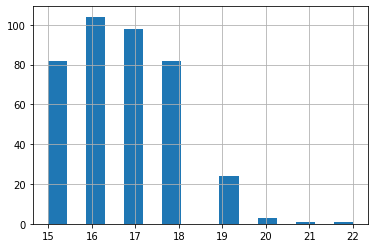

In [13]:
school.age.hist(bins=16)
school.age.describe()

<AxesSubplot:>

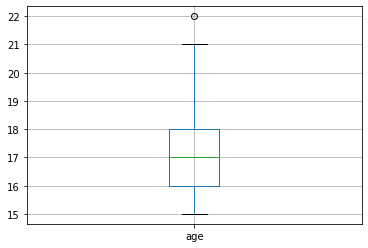

In [14]:
"""Данный график подтверждает наличие выброса"""
school.boxplot('age')

Первый квартиль: 16.0, Третий квартиль: 18.0, IQR: 2.0, Границы выбросов: [13.0;21.0].


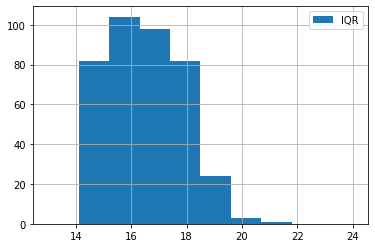

In [15]:
"""Определим границы выбросов"""
IQR = school.age.quantile(0.75) - school.age.quantile(0.25)
quant1 = school.age.quantile(0.25)
quant3 = school.age.quantile(0.75)
print('Первый квартиль: {},'.format(quant1),
      'Третий квартиль: {},'.format(quant3),
      "IQR: {},".format(IQR),
      'Границы выбросов: [{f};{I}].'.format(f=quant1-1.5*IQR,
                                            I=quant3+1.5*IQR))
school.age.loc[school.age.between(
    quant1-1.5*IQR, quant3+1.5*IQR)].hist(bins=10, range=(13, 24), label='IQR')
plt.legend()

In [16]:
"""Меняем выброс на наиболее частое значение в колонке"""
school.at[247, 'age'] = int(school.age.mode())

count    395.000000
mean       2.751899
std        1.094154
min        0.000000
25%        2.000000
50%        3.000000
75%        4.000000
max        4.000000
Name: Medu, dtype: float64

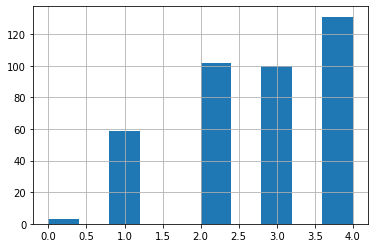

In [17]:
"""Рассмотрим столбец Medu"""
school.Medu.hist()
"""Распределение показывает нам, что выбросов нет, большинство значений лежит в границах от 2 до 4"""
school.Medu.describe()

In [18]:
school.Medu.value_counts()

4.0    131
2.0    102
3.0    100
1.0     59
0.0      3
Name: Medu, dtype: int64

<AxesSubplot:>

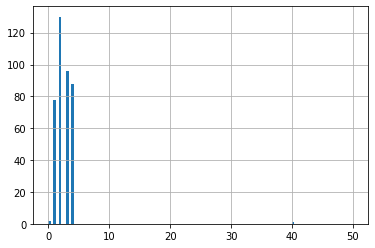

In [19]:
"""Изучим колонку Fedu"""
school.Fedu.hist(bins=120, range=(0, 50))

In [20]:
school.Fedu.value_counts()

2.0     130
3.0      96
4.0      88
1.0      78
0.0       2
40.0      1
Name: Fedu, dtype: int64

In [21]:
"""Имеется один выброс. Здравый смысл подсказывает, что это опечатка. 
Присвоим ему наиболее вероятное значение 4"""
# Посмотрим в какой строке лежит наше значение
school[school.Fedu == 40]

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,st_g,higher,internet,romantic,famrel,freetime,goout,health,absences,score
11,GP,F,15,U,GT3,T,2.0,40.0,services,other,reputation,father,3.0,3.0,0.0,no,yes,no,yes,yes,-9.0,yes,yes,no,5.0,2.0,2.0,4.0,4.0,60.0


In [22]:
# Присвоим ему значение 4
school.at[11, 'Fedu'] = 4

In [23]:
"""Посмотрим на Mjob"""
"""Все в пределах нормы, неожиданные значения отсутствуют"""
school.Mjob.value_counts()

other       152
services     98
at_home      58
teacher      55
health       32
Name: Mjob, dtype: int64

<AxesSubplot:xlabel='Mjob', ylabel='count'>

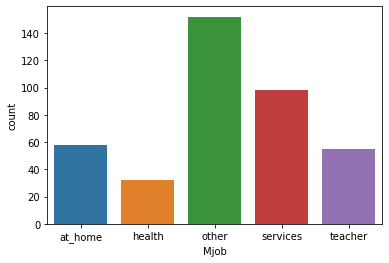

In [24]:
sns.countplot(x='Mjob', data=school)

In [25]:
"""Посмотрим на Fjob"""
"""Все в пределах нормы, неожиданные значения отсутствуют, пропусков нет"""
school.Fjob.value_counts()

other       233
services    102
teacher      29
at_home      16
health       15
Name: Fjob, dtype: int64

In [26]:
"""С существенным отрывом на выбор школы влияет ее образовательная программа"""
school.reason.value_counts()

course        154
home          104
reputation    103
other          34
Name: reason, dtype: int64

In [27]:
"""Матери - самые ответственные опекуны. Ах ты, статистика, бессердечная ты ...(не буду продолжать, смотрите TBBT за пояснениями)"""
school.guardian.value_counts()

mother    281
father     86
other      28
Name: guardian, dtype: int64

In [28]:
"""Ничего сверхъестественного не наблюдаем, все в пределах нормы"""
school.studytime.value_counts()

2.0    201
1.0    103
3.0     64
4.0     27
Name: studytime, dtype: int64

E:\Python\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='failures', ylabel='count'>

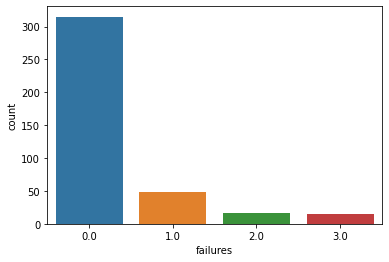

In [29]:
"""Пропусков нет, все в пределах допуска. У большинства детей нет внеучебных неудач."""
school.failures.value_counts()
sns.countplot('failures', data=school)

school.schoolsup.value_counts()

In [30]:
"""Далее идет ряд столбцов с двумя вариантами значений, быстро рассмотрим их"""
school.famsup.value_counts()

yes    258
no     137
Name: famsup, dtype: int64

In [31]:
school.paid.value_counts()

no     240
yes    155
Name: paid, dtype: int64

In [32]:
school.activities.value_counts()

yes    209
no     186
Name: activities, dtype: int64

In [33]:
school.nursery.value_counts()

yes    316
no      79
Name: nursery, dtype: int64

In [34]:
school.higher.value_counts()

yes    376
no      19
Name: higher, dtype: int64

In [35]:
school.internet.value_counts()

yes    339
no      56
Name: internet, dtype: int64

In [36]:
"""Ничего необычного не наблюдаем"""
school.romantic.value_counts()

no     271
yes    124
Name: romantic, dtype: int64

In [37]:
"""Первичный анализ показывает нам, что в столбце есть атипичное значение. Устраним его заменой на моду"""
school.famrel.describe()
school.famrel.value_counts()

 4.0    209
 5.0     99
 3.0     62
 2.0     17
 1.0      7
-1.0      1
Name: famrel, dtype: int64

<AxesSubplot:xlabel='famrel', ylabel='count'>

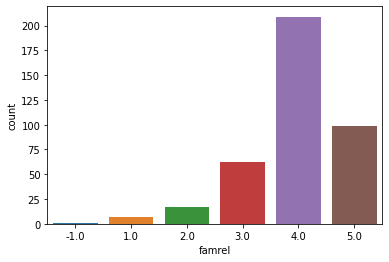

In [38]:
sns.countplot(x='famrel', data=school)

In [39]:
school[school.famrel == -1]

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,st_g,higher,internet,romantic,famrel,freetime,goout,health,absences,score
25,GP,F,16,U,GT3,T,2.0,2.0,services,services,home,mother,1.0,1.0,2.0,no,yes,yes,no,no,-3.0,yes,yes,no,-1.0,2.0,2.0,5.0,14.0,40.0


In [40]:
school.at[25, 'famrel'] = school.famrel.mode()

<AxesSubplot:xlabel='freetime', ylabel='count'>

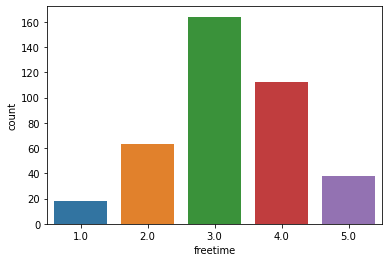

In [41]:
school.freetime.value_counts()
sns.countplot(x='freetime', data=school)

<AxesSubplot:>

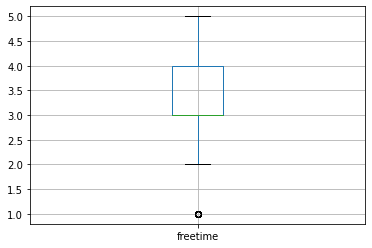

In [42]:
"""Боксплот показывает наличие выброса, но есть подозрение, что это не совсем так"""
school.boxplot('freetime')

In [43]:
school.freetime.describe()

count    395.000000
mean       3.225316
std        0.980711
min        1.000000
25%        3.000000
50%        3.000000
75%        4.000000
max        5.000000
Name: freetime, dtype: float64

In [44]:
"""Проверяем на границы выбросов - все чисто, интуиция не подвела"""
IQR_ft = school.freetime.quantile(0.75) - school.freetime.quantile(0.25)
quant1_ft = school.freetime.quantile(0.25)
quant3_ft = school.freetime.quantile(0.75)
print('Первый квартиль: {},'.format(quant1_ft),
      'Третий квартиль: {},'.format(quant3_ft),
      "IQR: {},".format(IQR_ft),
      'Границы выбросов: [{f};{I}].'.format(f=quant1_ft-1.5*IQR,
                                            I=quant3_ft+1.5*IQR_ft))

Первый квартиль: 3.0, Третий квартиль: 4.0, IQR: 1.0, Границы выбросов: [0.0;5.5].


In [45]:
school.goout.value_counts()

3.0    135
2.0    101
4.0     84
5.0     52
1.0     23
Name: goout, dtype: int64

<AxesSubplot:>

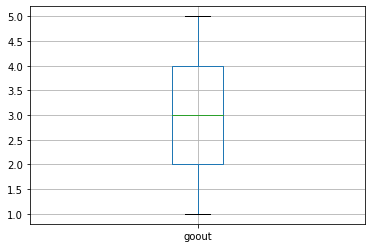

In [46]:
"""Ничего необычного не видим"""
school.boxplot('goout')

In [47]:
"""Нормальное распределение без выбросов"""
school.goout.describe()

count    395.000000
mean       3.103797
std        1.104610
min        1.000000
25%        2.000000
50%        3.000000
75%        4.000000
max        5.000000
Name: goout, dtype: float64

In [48]:
"""Все чисто"""
school.health.describe()

count    395.000000
mean       3.549367
std        1.372118
min        1.000000
25%        3.000000
50%        4.000000
75%        5.000000
max        5.000000
Name: health, dtype: float64

<AxesSubplot:>

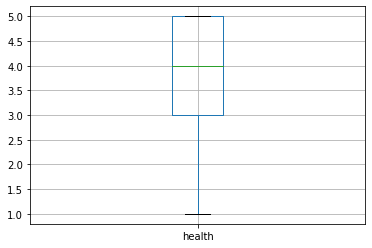

In [49]:
school.boxplot('health')

<AxesSubplot:>

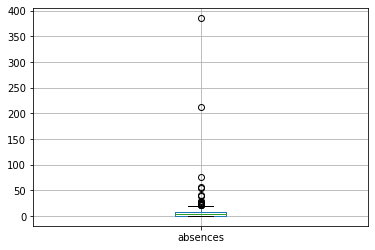

In [50]:
"""На графике видим целый букет выбросов, обработаем их"""
school.boxplot('absences')

In [51]:
"""Проверяем на границы выбросов"""
IQR_ab = school.absences.quantile(0.75) - school.absences.quantile(0.25)
quant1_ab = school.absences.quantile(0.25)
quant3_ab = school.absences.quantile(0.75)
print('Первый квартиль: {},'.format(quant1_ab),
      'Третий квартиль: {},'.format(quant3_ab),
      "IQR: {},".format(IQR_ab),
      'Границы выбросов: [{f};{I}].'.format(f=quant1_ab-1.5*IQR_ab,
                                            I=quant3_ab+1.5*IQR_ab))

Первый квартиль: 0.0, Третий квартиль: 8.0, IQR: 8.0, Границы выбросов: [-12.0;20.0].


In [52]:
school.absences.value_counts()

0.0      111
4.0       65
2.0       60
6.0       31
8.0       21
10.0      17
14.0      12
12.0      12
3.0        8
16.0       7
7.0        6
18.0       5
5.0        5
20.0       4
9.0        3
22.0       3
1.0        3
13.0       2
15.0       2
11.0       2
40.0       1
38.0       1
56.0       1
23.0       1
24.0       1
25.0       1
385.0      1
17.0       1
75.0       1
21.0       1
212.0      1
28.0       1
19.0       1
26.0       1
30.0       1
54.0       1
Name: absences, dtype: int64

In [53]:
"""В колонке, достаточно большое количество выбросов, данная функция присваивает значение 19 всем значениям, которые больше 20. Это максимальное пограничное значение"""


def abs_norm(x):
    if x >= 20:
        x = 19
    return x

In [54]:
school.absences = school.absences.apply(abs_norm)

In [55]:
school.absences.describe()

count    395.000000
mean       5.194937
std        5.580511
min        0.000000
25%        0.000000
50%        4.000000
75%        8.000000
max       19.000000
Name: absences, dtype: float64

<AxesSubplot:>

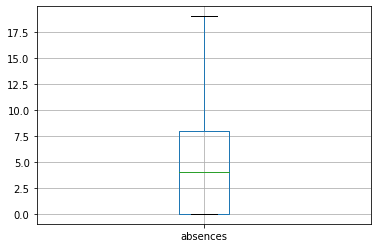

In [56]:
school.boxplot('absences')

<AxesSubplot:>

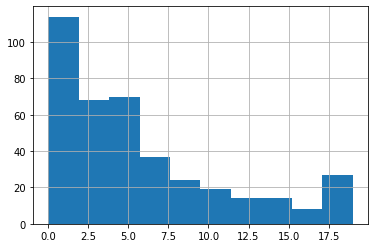

In [57]:
school.absences.hist()

In [58]:
"""Итак, самый главный параметр нашего проекта. Изучим то, что имеем"""
school.score.describe()

count    395.000000
mean      52.303797
std       22.746314
min        0.000000
25%       40.000000
50%       55.000000
75%       70.000000
max      100.000000
Name: score, dtype: float64

<AxesSubplot:>

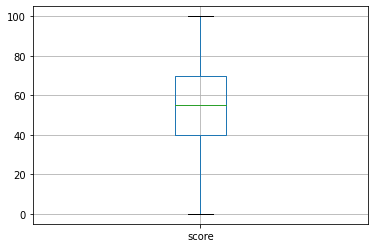

In [59]:
"""Все в норме, нет выбросов"""
school.boxplot('score')

In [60]:
school.score.value_counts()

50.0     54
55.0     52
0.0      37
75.0     33
65.0     31
60.0     31
40.0     31
45.0     27
70.0     27
80.0     16
30.0     15
90.0     12
35.0      9
25.0      7
85.0      6
95.0      5
20.0      1
100.0     1
Name: score, dtype: int64

<AxesSubplot:>

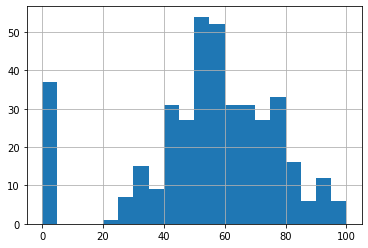

In [61]:
school.score.hist(bins=20)

In [62]:
"""Не нравится мне большое количество нулевых значений в score. Большой разрыв со следующим значением по рейтингу может говорить о том, что данное значение схоже по сути со значением Nan. Заменим его на медианное"""

school.loc[school.score == 0, 'score'] = school.score.median()
school.score.describe()

count    395.000000
mean      57.455696
std       15.315462
min       20.000000
25%       50.000000
50%       55.000000
75%       70.000000
max      100.000000
Name: score, dtype: float64

<AxesSubplot:>

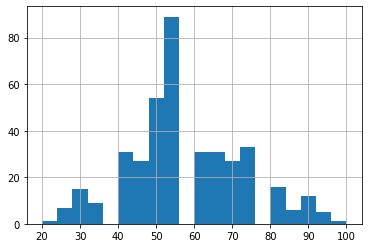

In [63]:
"""Примерно, так"""
school.score.hist(bins=20)

<AxesSubplot:>

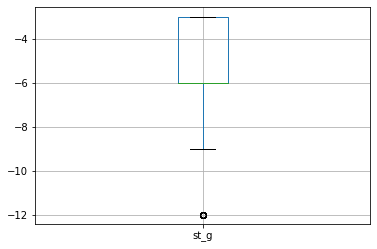

In [64]:
"Наш столбец с подвохом имеет выброс"
school.boxplot('st_g')

In [65]:
"""Проверяем на границы выбросов"""
IQR_st = school.st_g.quantile(0.75) - school.st_g.quantile(0.25)
quant1_st = school.st_g.quantile(0.25)
quant3_st = school.st_g.quantile(0.75)
print('Первый квартиль: {},'.format(quant1_st),
      'Третий квартиль: {},'.format(quant3_st),
      "IQR: {},".format(IQR_st),
      'Границы выбросов: [{f};{I}].'.format(f=quant1_st-1.5*IQR_st,
                                            I=quant3_st+1.5*IQR_st))

Первый квартиль: -6.0, Третий квартиль: -3.0, IQR: 3.0, Границы выбросов: [-10.5;1.5].


In [66]:
"""Заменим все выбросы на пограничное значение и посмотрим, что из этого выйдет"""


def st_norm(x):
    if x <= -10.5:
        x = -10
    return x

In [67]:
school.st_g = school.st_g.apply(st_norm)

In [68]:
school.st_g.value_counts()

-6.0     201
-3.0     103
-9.0      64
-10.0     27
Name: st_g, dtype: int64

<AxesSubplot:>

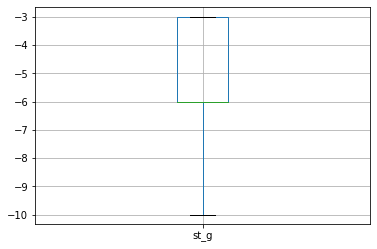

In [69]:
"""Так-то лучше"""
school.boxplot('st_g')

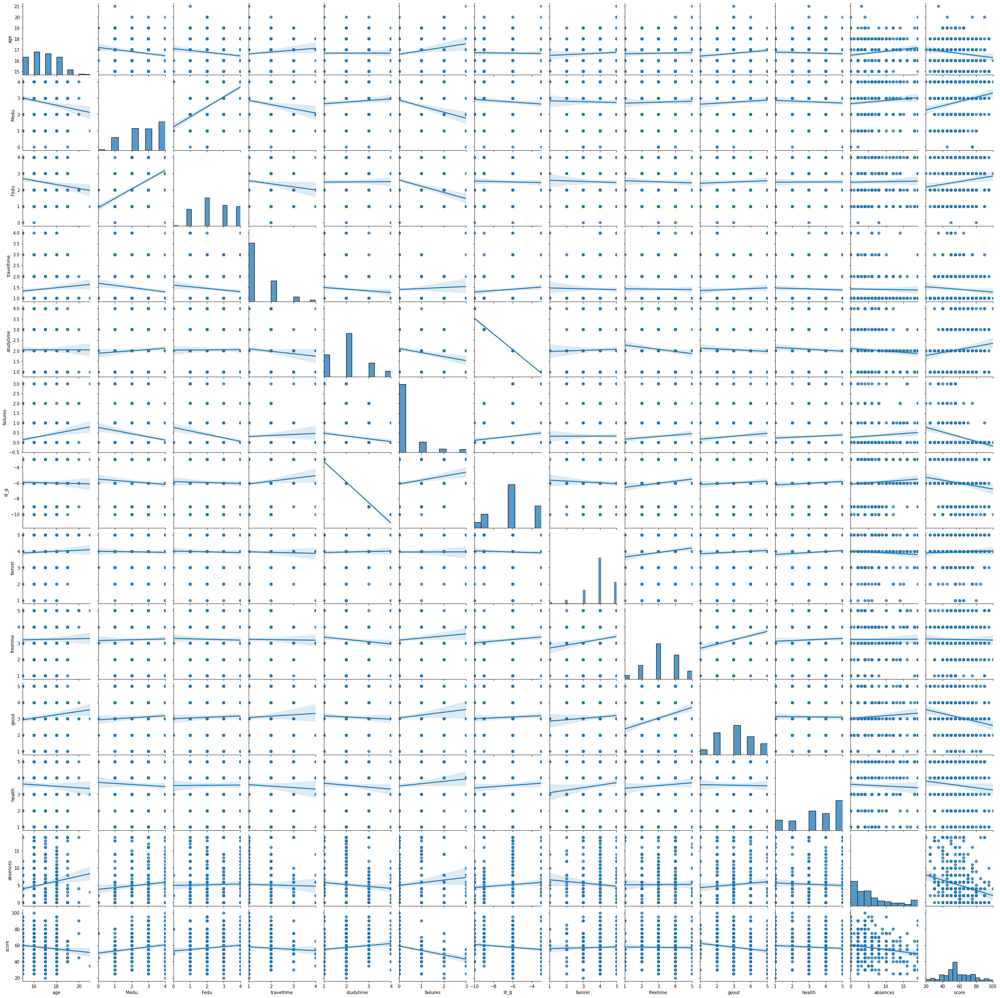

In [70]:
"""Пришло время проверить числовые переменные на взаимосвязь. Из-за большого 
количества столбцов в датасете графическое представление не очень информативно"""
sns.pairplot(school, kind='reg')

In [71]:
"""Построим матрицу корреляции. Для построения модели выберем колонки с минимальной корреляцией. Но, у нас есть две колонки, которые обратно коррелируют между собой, практически полностью, st_g и studytime. Интересная зависимость, но нам нужно отобрать для датасета некоррелирующие колонки, т.е. колонки с коэффициентом, близким к нулю. Таких столбцов 2: famrel, freetime."""
school.corr()

,age,Medu,Fedu,traveltime,studytime,failures,st_g,famrel,freetime,goout,health,absences,score
age,1.000000,-0.167748,-0.141173,0.093978,-0.000524,0.188137,-0.018471,0.047919,0.017396,0.116120,-0.042651,0.164907,-0.118908
Medu,-0.167748,1.000000,0.593116,-0.160877,0.077050,-0.245110,-0.083499,-0.020145,0.026210,0.063361,-0.050991,0.099389,0.181851
Fedu,-0.141173,0.593116,1.000000,-0.120629,0.007754,-0.260690,-0.028435,-0.028487,-0.029868,0.039084,0.006132,0.020366,0.122220
traveltime,0.093978,-0.160877,-0.120629,1.000000,-0.094637,0.049670,0.106908,-0.024643,-0.012496,0.051775,-0.044842,-0.021708,-0.069700
studytime,-0.000524,0.077050,0.007754,-0.094637,1.000000,-0.166598,-0.984447,0.027181,-0.119014,-0.051090,-0.073674,-0.084972,0.132675
failures,0.188137,-0.245110,-0.260690,0.049670,-0.166598,1.000000,0.164219,0.003015,0.094826,0.113649,0.075849,0.101100,-0.256578
st_g,-0.018471,-0.083499,-0.028435,0.106908,-0.984447,0.164219,1.000000,-0.043419,0.115586,0.051912,0.068494,0.084404,-0.129906
famrel,0.047919,-0.020145,-0.028487,-0.024643,0.027181,0.003015,-0.043419,1.000000,0.156711,0.066468,0.096586,-0.072740,0.027798
freetime,0.017396,0.026210,-0.029868,-0.012496,-0.119014,0.094826,0.115586,0.156711,1.000000,0.292305,0.060557,0.005403,-0.013274
goout,0.116120,0.063361,0.039084,0.051775,-0.051090,0.113649,0.051912,0.066468,0.292305,1.000000,-0.014274,0.084409,-0.168881


In [72]:
def get_boxplot(column):
    fig, ax = plt.subplots(figsize=(4, 4))
    sns.boxplot(x=column, y='score',
                data=school.loc[school.loc[:, column].isin(school.loc[:,
                                                                      column].value_counts().index[:8])],
                ax=ax)
    plt.xticks(rotation=45)
    ax.set_title('Boxplot for ' + column)
    plt.show()

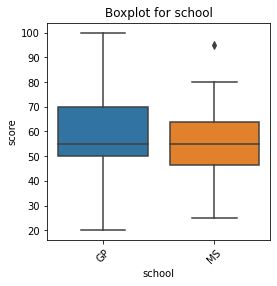

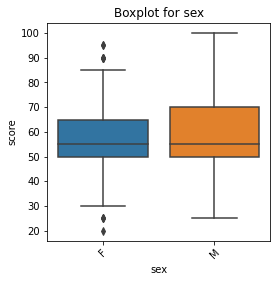

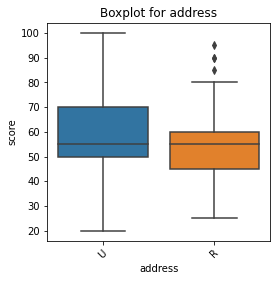

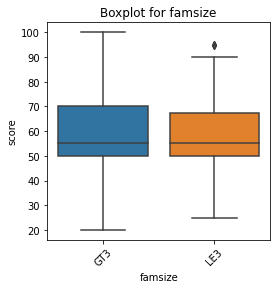

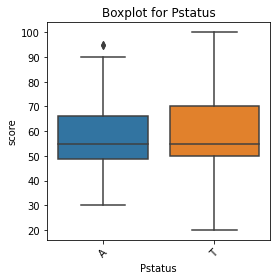

...

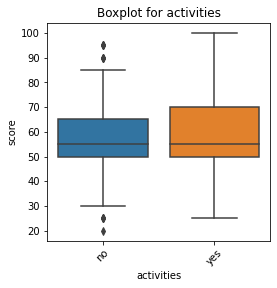

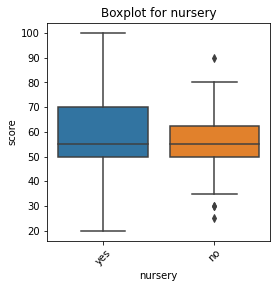

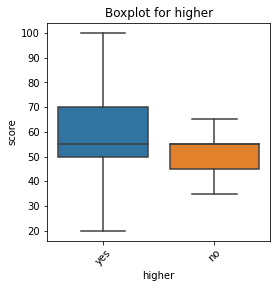

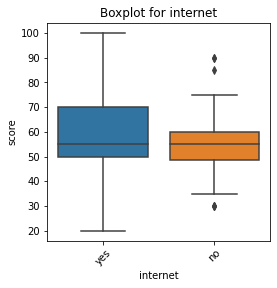

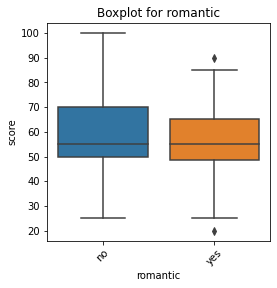

In [73]:
"""Построим boxplot по номинативным колонкам"""
for col in ['school', 'sex', 'address', 'famsize', 'Pstatus', 'Mjob', 'Fjob', 'reason', 'guardian', 'schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic']:
    get_boxplot(col)

In [74]:
def get_stat_dif(column):
    cols = school.loc[:, column].value_counts().index[:12]
    combinations_all = list(combinations(cols, 2))
    for comb in combinations_all:
        if ttest_ind(school.loc[school.loc[:, column] == comb[0], 'score'],
                     school.loc[school.loc[:, column] == comb[1], 'score']).pvalue \
                <= 0.05/len(combinations_all):  # Учли поправку Бонферони
            print('Найдены статистически значимые различия для колонки', column)
            break

In [75]:
"""Запустим тест Стьюдента. Получаем три столбца, которые серьезно отличаются от остальных. Их и внесем в итоговый датасет"""
for col in ['school', 'sex', 'address', 'famsize', 'Pstatus', 'Mjob', 'Fjob', 'reason', 'guardian', 'schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic']:
    get_stat_dif(col)

Найдены статистически значимые различия для колонки sex
Найдены статистически значимые различия для колонки address
Найдены статистически значимые различия для колонки Mjob
Найдены статистически значимые различия для колонки Fjob
Найдены статистически значимые различия для колонки schoolsup


In [76]:
"""Итоговый датасет для модели"""
df_for_model = school.loc[:, ['famrel', 'freetime',
                              'sex', 'address', 'Mjob', 'Fjob', 'schoolsup']]
df_for_model.head()

,traveltime,famrel,freetime,health,sex,address,Mjob,Fjob,schoolsup
0,2.0,4.0,3.0,3.0,F,U,at_home,teacher,yes
1,1.0,5.0,3.0,3.0,F,U,at_home,other,no
2,1.0,4.0,3.0,3.0,F,U,at_home,other,yes
3,1.0,3.0,2.0,5.0,F,U,health,other,no
4,1.0,4.0,3.0,5.0,F,U,other,other,no


# Выводы

- Датасет, достаточно, небольшой, что непозволяет удалять строки с пропущенными значениями
- В датасете было большое количество пропусков
- В датасете было большое количество выбросов, что говорит о том, что данные грязные, было допущено большое количество ошибок при сборе
- Положительная корреляция столбца famrel может говорить о том, что на итоговый балл могут влиять взаимоотношения в семье. Чем они лучше - тем меньше стресса, выше балл.
- Положительная корреляция столбца freetime может говорить о том, что чем больше свободного времени - тем лучше соблюдается баланс учебы и отдыха, что также является положительным фактором.
- Самые важные столбцы для нашего итогового датасета это: 'famrel', 'freetime', 'sex' 'address', 'address', 'Mjob', 'Fjob', 'schoolsup'.